# Install and load libraries required

In [1]:
using Pkg 
Pkg.add([
    "CSV", 
    "DataFrames", 
    "Statistics", 
    "StatsBase", 
    "Plots", 
    "StatsPlots", 
    "Dates", 
    "LinearAlgebra", 
    "MultivariateStats", 
    "Clustering", 
    "Distributions",
    "HypothesisTests",           
    "GLM",            
    "Markdown"
])

   Resolving package versions...
  No Changes to `/opt/julia/environments/v1.9/Project.toml`
  No Changes to `/opt/julia/environments/v1.9/Manifest.toml`


In [2]:
using CSV
using DataFrames
using Statistics
using StatsBase
using Plots
using StatsPlots
using Dates
using LinearAlgebra
using MultivariateStats
using Clustering
using Distributions
using HypothesisTests
using GLM
using Markdown

In [3]:
include("eda_utils.jl") 

Libraries loaded successfully!


generate_summary_report

In [4]:
# Set plot defaults for publication-quality figures
gr()
default(size=(1000, 600), dpi=300, legend=:best, 
        guidefontsize=12, tickfontsize=10, titlefontsize=14)

println("Libraries loaded successfully!")

Libraries loaded successfully!


# SECTION 1: DATA LOADING AND INITIAL INSPECTION

In [5]:
tracks, features = load_datasets() # adjust paths if needed 

# Generate quality reports
tracks_missing = data_quality_report(tracks, "TRACKS")
features_missing = data_quality_report(features, "FEATURES")


=== Loading Datasets ===
Tracks shape: (106574, 53)
Features shape: (106575, 519)

DATA QUALITY REPORT: TRACKS

Dimensions: 106574 rows × 53 columns

Missing Values Analysis:

Top 10 columns with missing values:
  1. track_lyricist_Column49: 106093 (99.55%)
  2. track_publisher_Column51: 105140 (98.65%)
  3. track_information_Column44: 104065 (97.65%)
  4. track_composer_Column36: 102739 (96.4%)
  5. artist_active_year_end_Column16: 101199 (94.96%)
  6. artist_wikipedia_page_Column31: 100993 (94.76%)
  7. track_date_recorded_Column38: 100415 (94.22%)
  8. artist_related_projects_Column28: 93422 (87.66%)
  9. artist_associated_labels_Column17: 92303 (86.61%)
  10. track_language_code_Column46: 91550 (85.9%)

Data Types Distribution:
  Union{Missing, String}: 17 columns
  Int64: 16 columns
  Union{Missing, String31}: 8 columns
  String: 6 columns
  Union{Missing, Float64}: 2 columns
  String15: 1 columns
  String31: 1 columns
  Union{Missing, String3}: 1 columns
  String7: 1 columns

DA

Dict{String, Int64} with 518 entries:
  "spectral_contrast_skew_06"   => 1
  "mfcc_kurtosis_02"            => 1
  "chroma_cens_kurtosis_08"     => 1
  "chroma_cqt_max_10"           => 1
  "mfcc_std_04"                 => 1
  "chroma_cens_mean_04"         => 1
  "mfcc_max_16"                 => 1
  "spectral_contrast_median_05" => 1
  "chroma_cens_median_05"       => 1
  "mfcc_kurtosis_14"            => 1
  "spectral_contrast_skew_02"   => 1
  "chroma_cqt_std_05"           => 1
  "tonnetz_median_01"           => 1
  "mfcc_skew_16"                => 1
  "mfcc_max_19"                 => 1
  "spectral_contrast_min_02"    => 1
  "spectral_contrast_max_07"    => 1
  "tonnetz_std_01"              => 1
  "chroma_cens_max_01"          => 1
  "spectral_rolloff_skew_01"    => 1
  "mfcc_kurtosis_18"            => 1
  "mfcc_max_11"                 => 1
  "chroma_cens_kurtosis_02"     => 1
  "mfcc_max_07"                 => 1
  "tonnetz_std_02"              => 1
  ⋮                             => ⋮

# SECTION 2: TRACKS METADATA ANALYSIS



TEMPORAL ANALYSIS

Available date columns:
  - album_date_created_Column3
  - album_date_released_Column4
  - artist_date_created_Column20
  - track_date_created_Column37
  - track_date_recorded_Column38

Track Creation Date Range:
  Earliest: 2008-11-25 17:49:06
  Latest: 2017-03-30 15:23:39
  Total tracks with dates: 106574

GENRE ANALYSIS

Genre columns found: ["track_genre_top_Column41", "track_genres_Column42", "track_genres_all_Column43"]

Top 15 Genres by Track Count:
  1. Rock: 14182 tracks (28.59%)
  2. Experimental: 10608 tracks (21.39%)
  3. Electronic: 9372 tracks (18.9%)
  4. Hip-Hop: 3552 tracks (7.16%)
  5. Folk: 2803 tracks (5.65%)
  6. Pop: 2332 tracks (4.7%)
  7. Instrumental: 2079 tracks (4.19%)
  8. International: 1389 tracks (2.8%)
  9. Classical: 1230 tracks (2.48%)
  10. Jazz: 571 tracks (1.15%)
  11. Old-Time / Historic: 554 tracks (1.12%)
  12. Spoken: 423 tracks (0.85%)
  13. Country: 194 tracks (0.39%)
  14. Soul-RnB: 175 tracks (0.35%)
  15. Blues: 110 trac

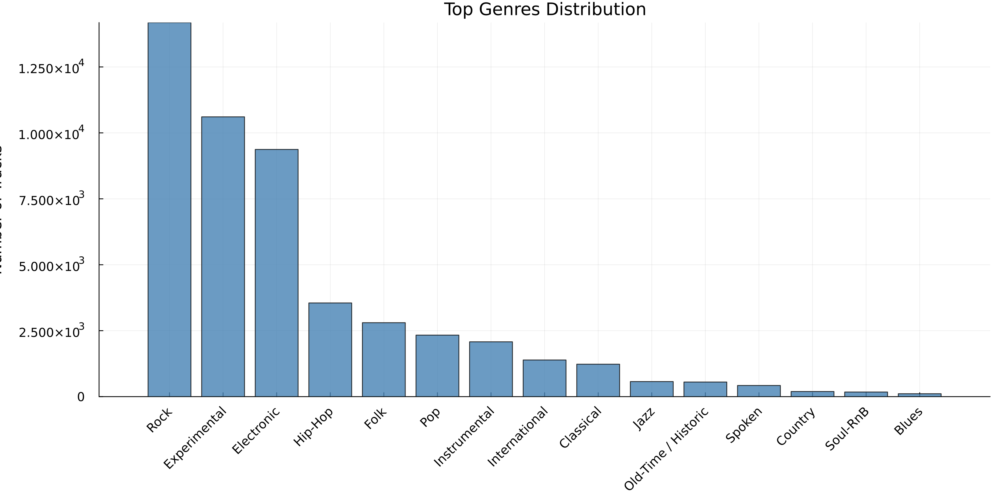


✓ Saved: genre_distribution.png

DURATION ANALYSIS

Duration Statistics (seconds):
  Count: 106558
  Mean: 277.89
  Median: 216.0
  Std Dev: 305.52
  Min: 1.0
  Max: 18350.0
  25th Percentile: 149.0
  75th Percentile: 306.0

Total Duration:
  Hours: 8225.41
  Days: 342.73


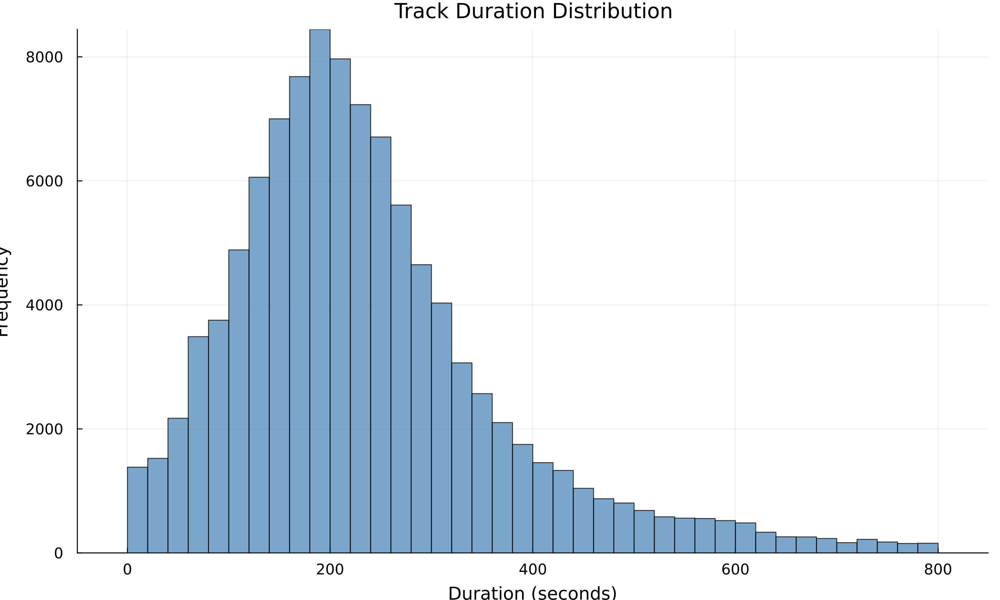


✓ Saved: duration_distribution.png


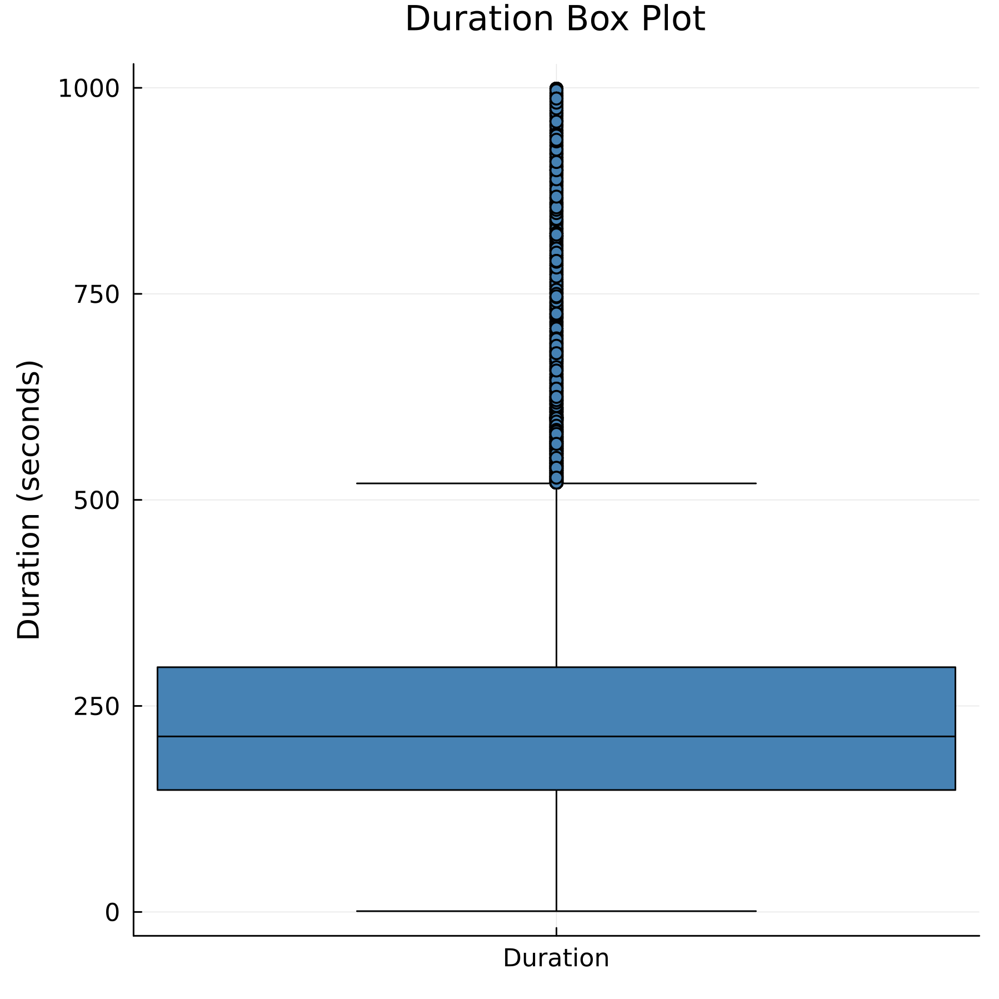

✓ Saved: duration_boxplot.png

USER ENGAGEMENT ANALYSIS

Found engagement metrics:
  - track_listens: track_listens_Column48
  - track_interest: track_interest_Column45
  - track_favorites: track_favorites_Column40
  - track_comments: track_comments_Column35

track_listens Statistics:
  Count: 106574
  Mean: 2329.35
  Median: 764.0
  Max: 543252
  90th Percentile: 4866.0

track_interest Statistics:
  Count: 106574
  Mean: 3541.31
  Median: 1314.0
  Max: 3293557
  90th Percentile: 6794.7

track_favorites Statistics:
  Count: 106574
  Mean: 3.18
  Median: 1.0
  Max: 1482
  90th Percentile: 7.0

track_comments Statistics:
  Count: 106574
  Mean: 0.03
  Median: 0.0
  Max: 37
  90th Percentile: 0.0


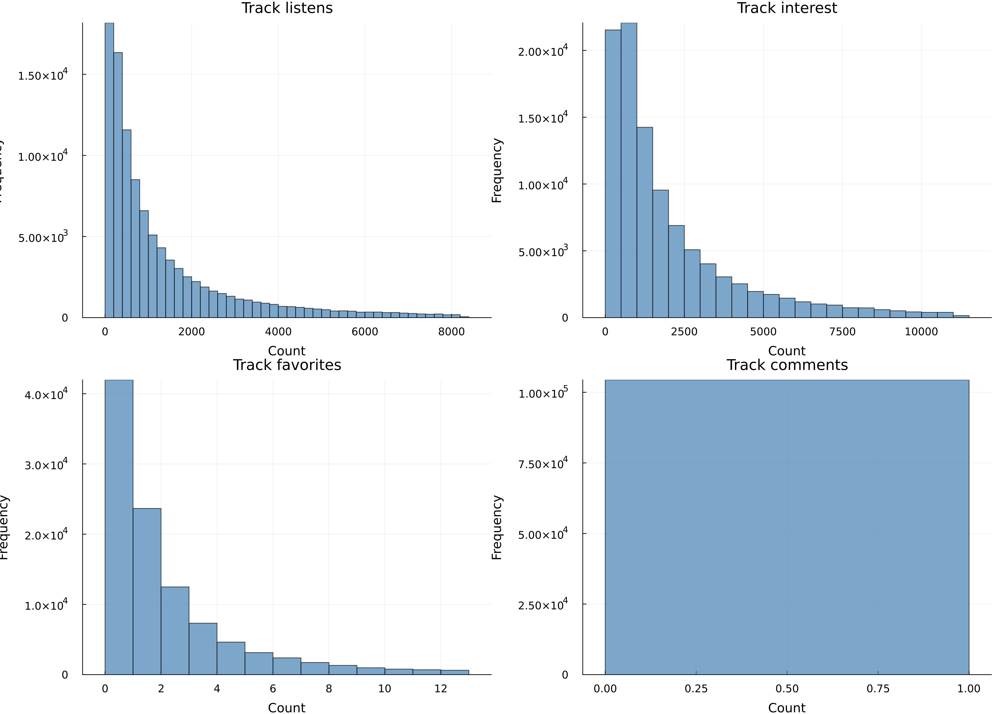


✓ Saved: engagement_metrics. png


In [6]:
# Execute metadata analysis
analyze_temporal_patterns(tracks)
genre_distribution = analyze_genres(tracks)
analyze_duration(tracks)
analyze_engagement(tracks)

# SECTION 3: AUDIO FEATURES ANALYSIS


FEATURE ORGANIZATION
  mfcc: 140 features
  chroma: 252 features
  spectral: 70 features
  zcr: 7 features
  rmse: 7 features
  tonnetz: 42 features
  contrast: 49 features
  bandwidth: 7 features
  centroid: 7 features
  rolloff: 7 features

FEATURE STATISTICS

zcr Features:
  Count: 7
  Mean range: [0.0023, 29.4646]
  Std range: [0.0052, 88.9754]

chroma Features:
  Count: 252
  Mean range: [-0.3651, 0.9999]
  Std range: [0.0054, 72.0719]

rmse Features:
  Count: 7
  Mean range: [0.0123, 12.8843]
  Std range: [0.1768, 32.5827]

rolloff Features:
  Count: 7
  Mean range: [2.0238, 9249.8729]
  Std range: [2.979, 1278.5184]

spectral Features:
  Count: 70
  Mean range: [-0.4212, 9249.8729]
  Std range: [0.2921, 1278.5184]

bandwidth Features:
  Count: 7
  Mean range: [1.0862, 3542.2854]
  Std range: [1.8466, 507.3704]

mfcc Features:
  Count: 140
  Mean range: [-525.5447, 234.038]
  Std range: [0.3245, 105.3886]

tonnetz Features:
  Count: 42
  Mean range: [-0.3073, 1.7179]
  Std range

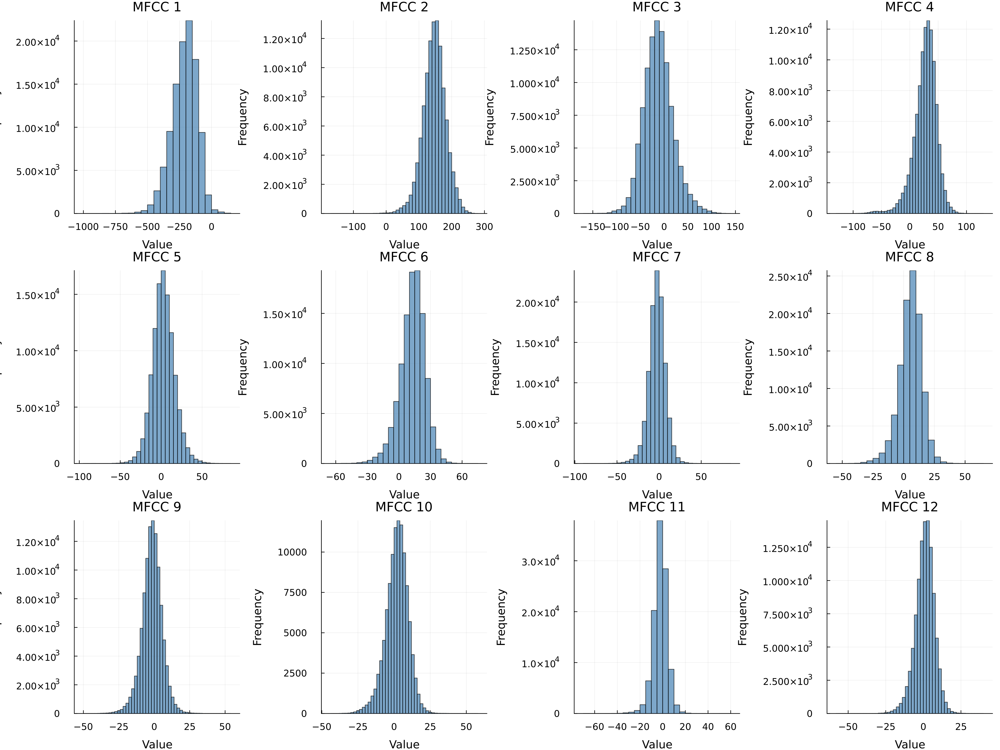

✓ Saved: mfcc_distributions.png


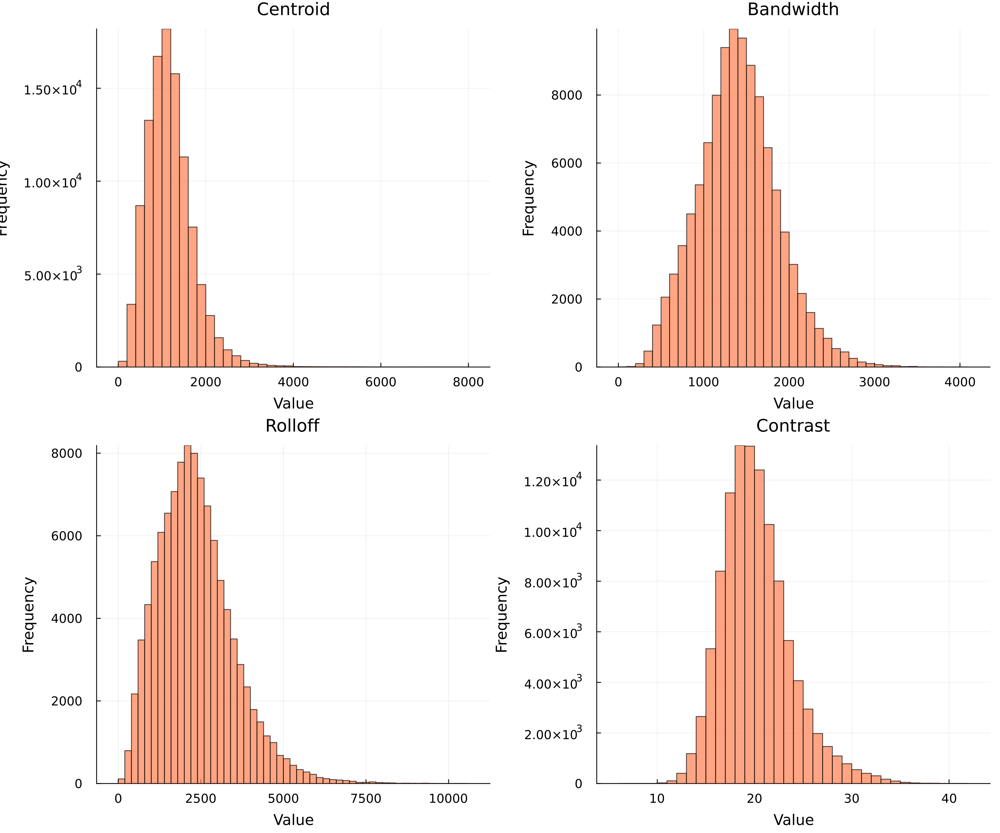

✓ Saved: spectral_features.png

FEATURE CORRELATION ANALYSIS


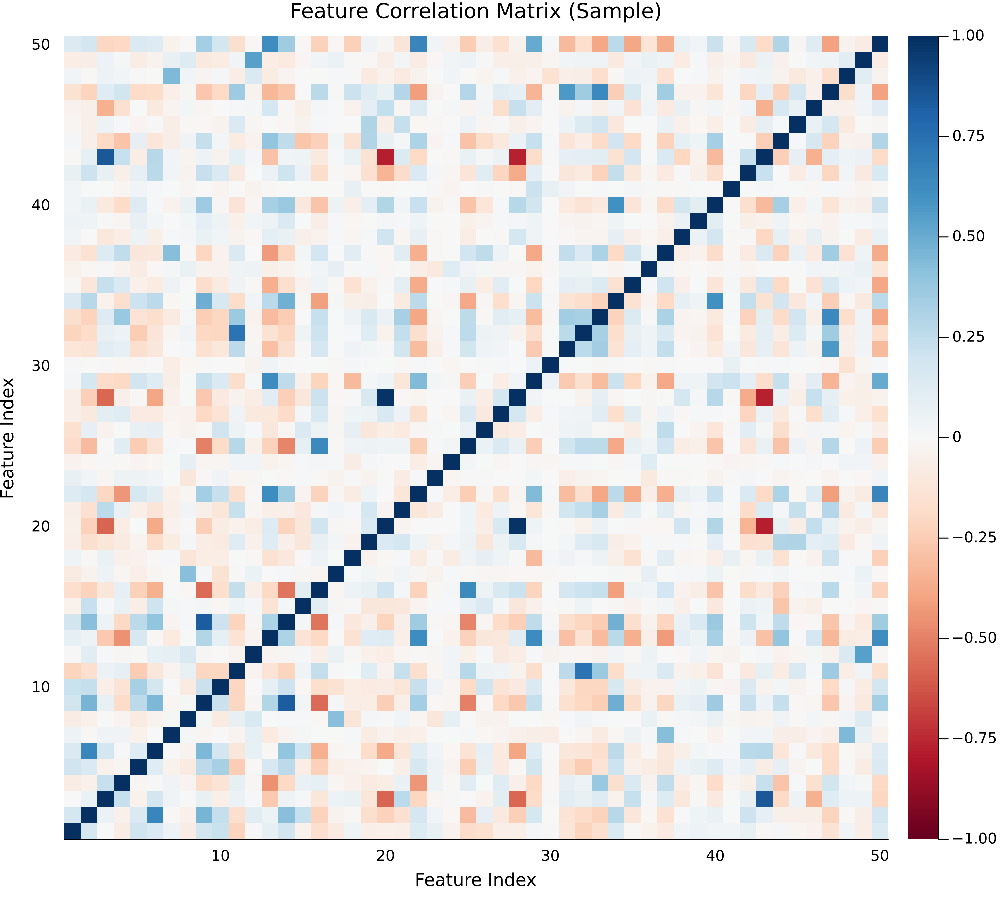

✓ Saved: feature_correlations.png

Highly Correlated Feature Pairs (|r| > 0.8):
  1. 02 <-> 02: 0.987
  2. 01 <-> 01: 0.852
  3. 16 <-> 18: 0.833


In [7]:
# Execute feature analysis
feature_groups = organize_features(features)
feature_stats = compute_feature_statistics(features, feature_groups)
visualize_feature_distributions(features, feature_groups)
analyze_feature_correlations(features, feature_groups)

# SECTION 4: ADVANCED MULTIVARIATE ANALYSIS



PRINCIPAL COMPONENT ANALYSIS

Explained Variance by Component:
  PC1: 12.0% (Cumulative: 12.0%)
  PC2: 6.83% (Cumulative: 18.83%)
  PC3: 4.42% (Cumulative: 23.25%)
  PC4: 3.81% (Cumulative: 27.06%)
  PC5: 2.86% (Cumulative: 29.92%)
  PC6: 2.62% (Cumulative: 32.54%)
  PC7: 2.43% (Cumulative: 34.97%)
  PC8: 2.37% (Cumulative: 37.35%)
  PC9: 2.3% (Cumulative: 39.65%)
  PC10: 2.04% (Cumulative: 41.69%)
  PC11: 1.78% (Cumulative: 43.47%)
  PC12: 1.64% (Cumulative: 45.11%)
  PC13: 1.47% (Cumulative: 46.59%)
  PC14: 1.44% (Cumulative: 48.02%)
  PC15: 1.39% (Cumulative: 49.41%)


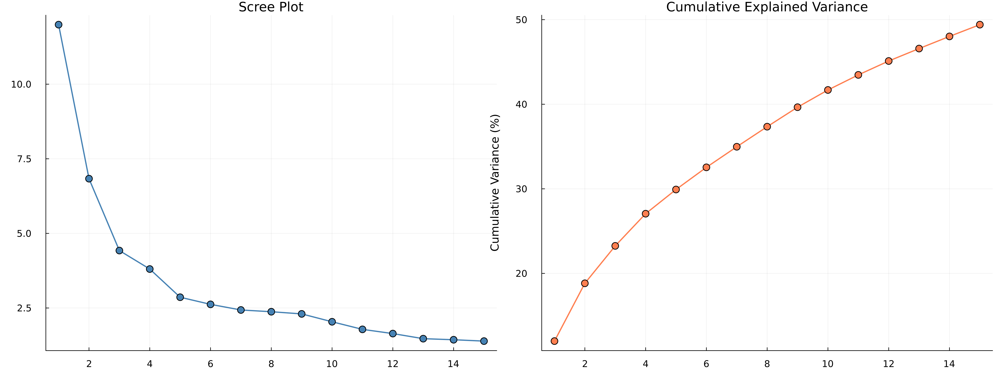

✓ Saved: pca_analysis.png

CLUSTERING ANALYSIS

Clustering Results:
  Number of clusters: 8
  Converged: true
  Iterations: 39

Cluster Sizes:
  Cluster 1: 214 samples (4.28%)
  Cluster 2: 683 samples (13.66%)
  Cluster 3: 363 samples (7.26%)
  Cluster 4: 978 samples (19.56%)
  Cluster 5: 865 samples (17.3%)
  Cluster 6: 1172 samples (23.44%)
  Cluster 7: 4 samples (0.08%)
  Cluster 8: 721 samples (14.42%)


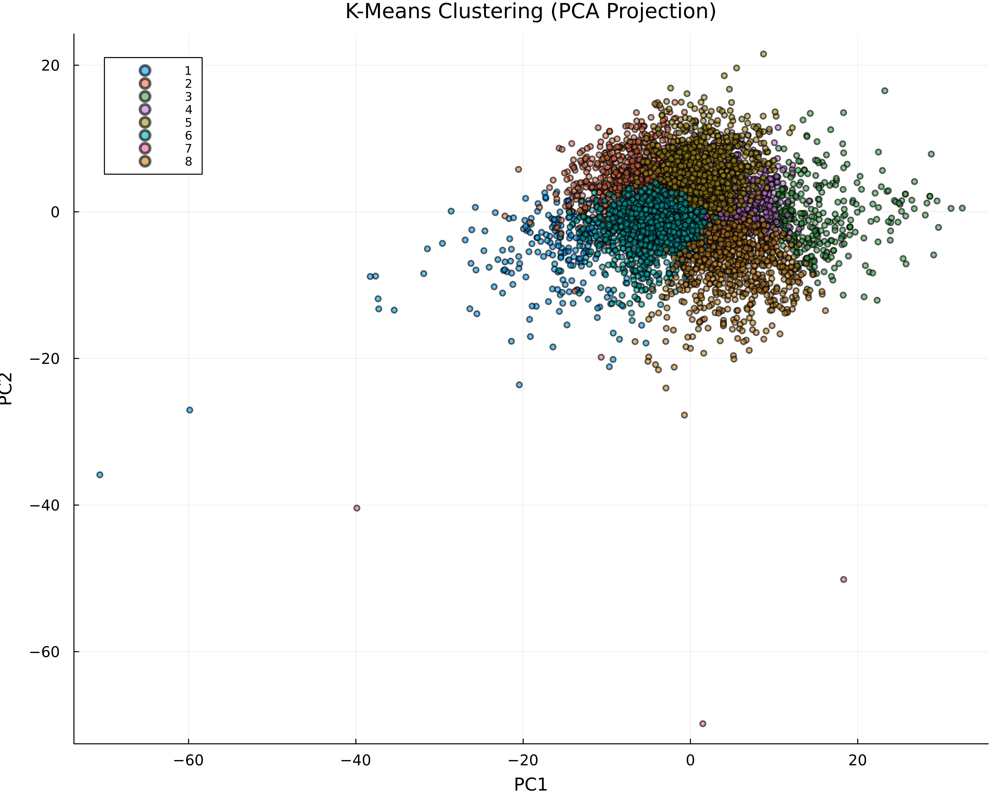

✓ Saved: clustering_analysis.png


KmeansResult{Matrix{Float64}, Float64, Int64}([0.03244717277722964 0.026559001742898554 … 8.03944256905008 0.07630434899202664; 0.17805052066612378 0.1535658357104196 … 15.525716784117758 -0.025801459459183503; … ; -0.21695102212355 -0.14418995760859507 … 1.016870666721414 0.2854082818781096; -0.07858734638388798 0.4712195357939558 … -0.9316236466948815 -0.5337950386227515], [5, 2, 6, 5, 8, 6, 3, 1, 6, 2  …  2, 8, 3, 6, 4, 6, 5, 6, 6, 2], [272.34370095520137, 262.9397861488601, 321.28190090499834, 126.5199783165847, 404.7799784475698, 540.671828397687, 179.14534603316292, 643.8323230227913, 532.6144636544311, 421.0150221548133  …  501.60312537995594, 533.5293301509528, 450.1077246529287, 274.7474399635698, 180.81648635657064, 186.81388539889207, 180.87383280117461, 467.6136493760803, 282.86217401537766, 973.7856728764635], [214, 683, 363, 978, 865, 1172, 4, 721], [214, 683, 363, 978, 865, 1172, 4, 721], 2.110655611841279e6, 39, true)

In [8]:
# Execute advanced analysis
pca_model, pca_data = perform_pca_analysis(features, 15)
clustering_result = perform_clustering_analysis(features, 8)

# SECTION 5: GENRE-BASED ANALYSIS



GENRE-BASED FEATURE COMPARISON

Note: Using DataFrame indices as track IDs
Tracks rows: 106574
Features rows: 106575
Will use only matching rows

Analyzing top 8 genres
  1. Rock: 14182 tracks
  2. Experimental: 10608 tracks
  3. Electronic: 9372 tracks
  4. Hip-Hop: 3552 tracks
  5. Folk: 2803 tracks
  6. Pop: 2332 tracks
  7. Instrumental: 2079 tracks
  8. International: 1389 tracks

Comparing 4 features across genres
  ✓ Created plot for mfcc_mean_01
  ✓ Created plot for spectral_centroid_mean_01
  ✓ Created plot for spectral_bandwidth_mean_01
  ✓ Created plot for zcr_kurtosis_01


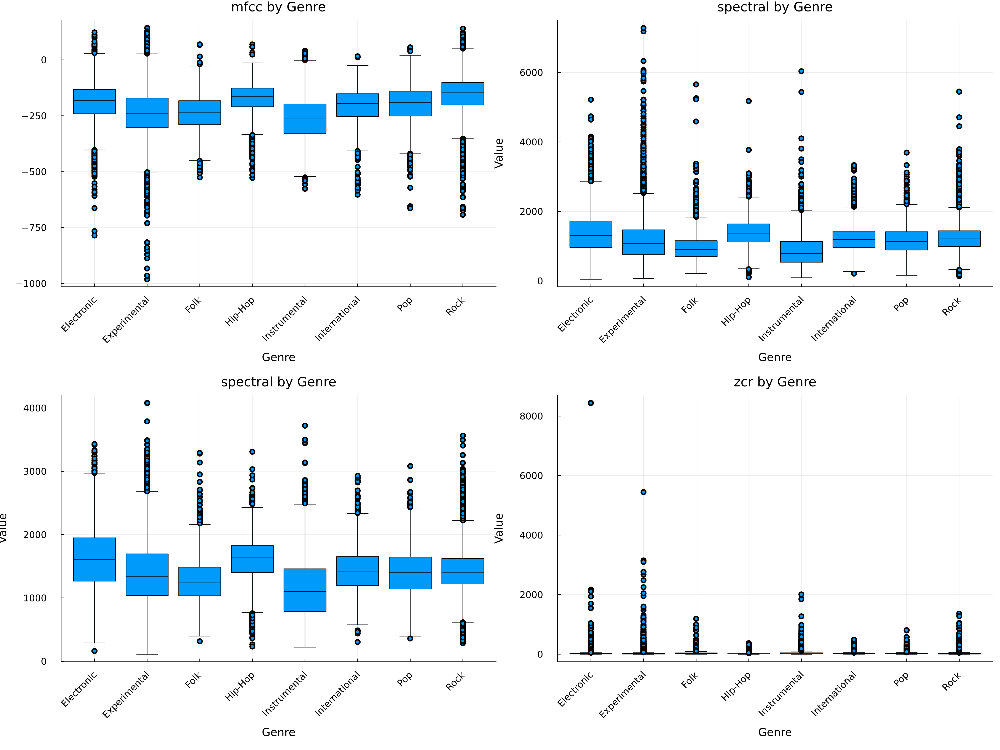


✓ Saved: genre_feature_comparison. png
Successfully created 4 comparison plots


In [9]:
# Execute genre-based analysis
compare_features_by_genre(tracks, features)

# SECTION 6: SUMMARY AND CONCLUSIONS


In [10]:
# # Generate final summary
# summary_report = generate_summary_report(tracks, features)

# println("\n" * "="^80)
# println("EXPLORATORY DATA ANALYSIS COMPLETE!")
# println("="^80)
# println("\nGenerated visualizations:")
# println("  • genre_distribution.png")
# println("  • duration_distribution.png")
# println("  • engagement_metrics.png")
# println("  • mfcc_distributions.png")
# println("  • spectral_features.png")
# println("  • feature_correlations.png")
# println("  • pca_analysis. png")
# println("  • clustering_analysis.png")
# println("  • genre_feature_comparison. png")
# println("\n✓ Analysis complete! Check the generated files for detailed results.")